# Sample 15arc-sec GEBCO_2023.nc on OM4p25 grid

## Apply edits to the topography.

## Region 20: 30,50,-80,-15,

In [1]:
# Notebook editor: John Krasting

# This notebook originated from Stephen Griffies, with many other contributors:
# Stephen.Griffies
# Alistair.Adcroft
# Robert.Hallberg
# Niki.Zadeh
# Raphael.Dussin

In [2]:
Region_Boundaries = [30,50,-80,-15]
Region_Name = '20: US+Canada East Coast / Subtropical Atlantic'

In [3]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import netCDF4
import xarray as xr
import cmocean
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import sys
sys.path.insert(1, './tools/')
from topo_tools import *

Resolution = 240 cells/degree
GEBCO loaded with (nj,ni) =  (43200, 86400)  min(lon) =  -300.0  max(lon) =  60.0


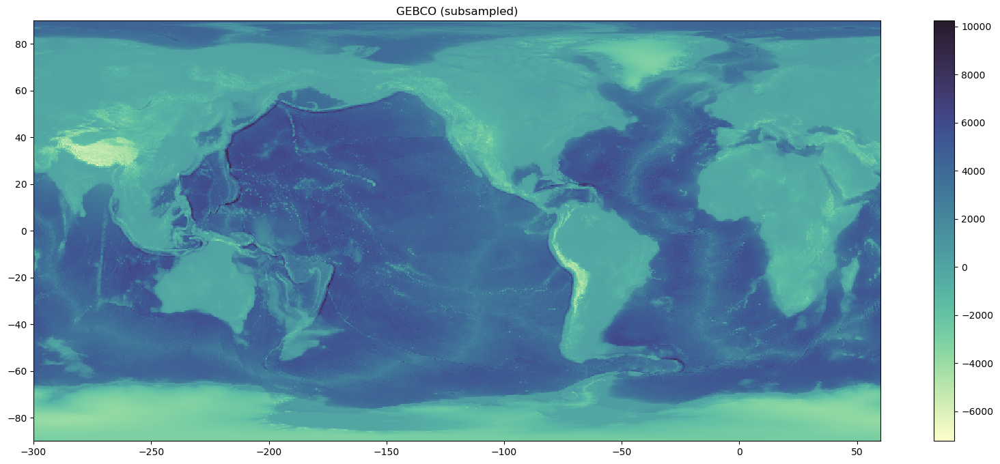

In [4]:
# GEBCO-2020 + Bedmachine combined topography 

fname_gebco  = "/archive/gold/datasets/topography/GEBCO_2023/GEBCO_2023.nc"

GEBCO = GEBCO_data(fname_gebco)

plt.figure(figsize=(20,8))
plt.pcolormesh(GEBCO.lonq[::100], GEBCO.latq[::100], GEBCO.depth[::100,::100], cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('GEBCO (subsampled)');

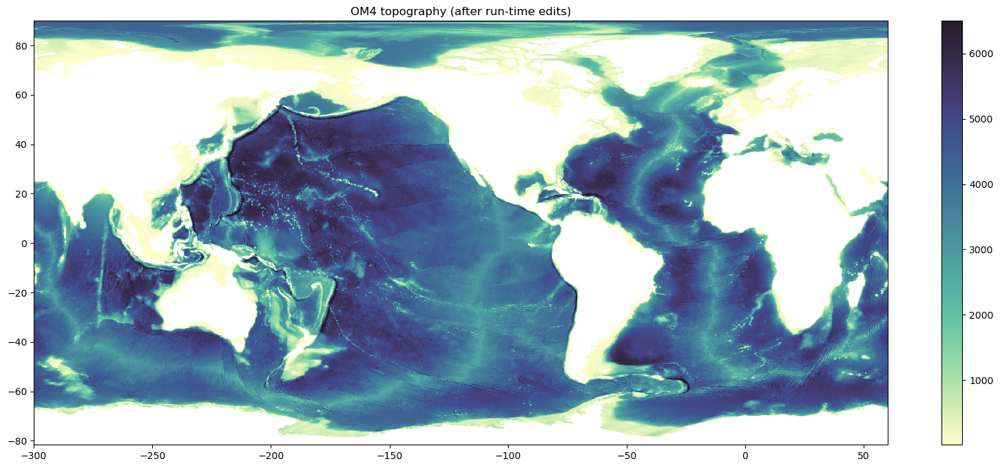

In [5]:
OM4 = OM4_data('/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_hgrid.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_static.nc',
               '/archive/gold/datasets/OM4_025/mosaic.v20170622.unpacked/ocean_mask.nc')
plt.figure(figsize=(20,8))
plt.pcolormesh(OM4.lonq, OM4.latq, OM4.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM4 topography (after run-time edits)');

OM5 longitudes are inconsistent!
OM5 latitudes are inconsistent!


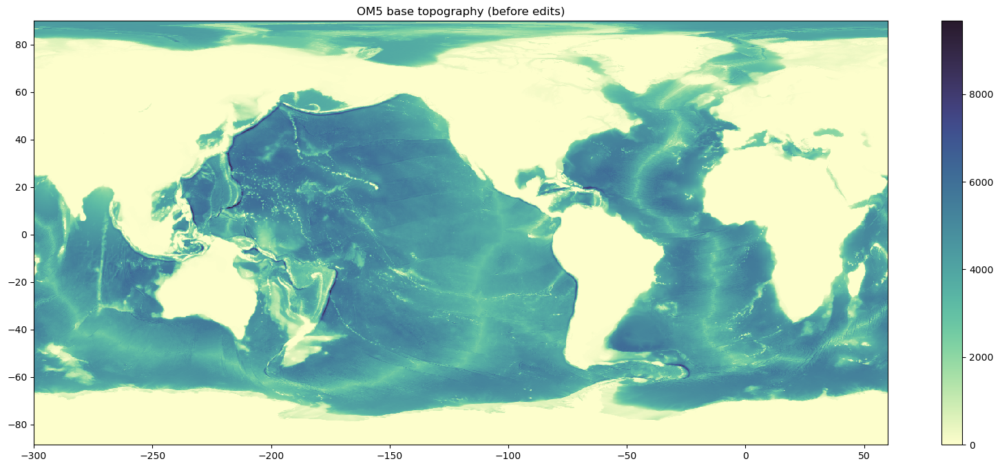

In [6]:
OM5 = OM5_data('/archive/jpk/OM5/OM5_025/prototypes/v20231109/tile_files/ocean_hgrid.nc',
               '/archive/jpk/OM5/OM5_025/prototypes/v20231109/tile_files/ocean_topog_merged.nc')

plt.figure(figsize=(20,8))
plt.pcolormesh(OM5.lonq, OM5.latq, OM5.depth, cmap=cmocean.cm.deep)
plt.colorbar(); plt.title('OM5 base topography (before edits)');

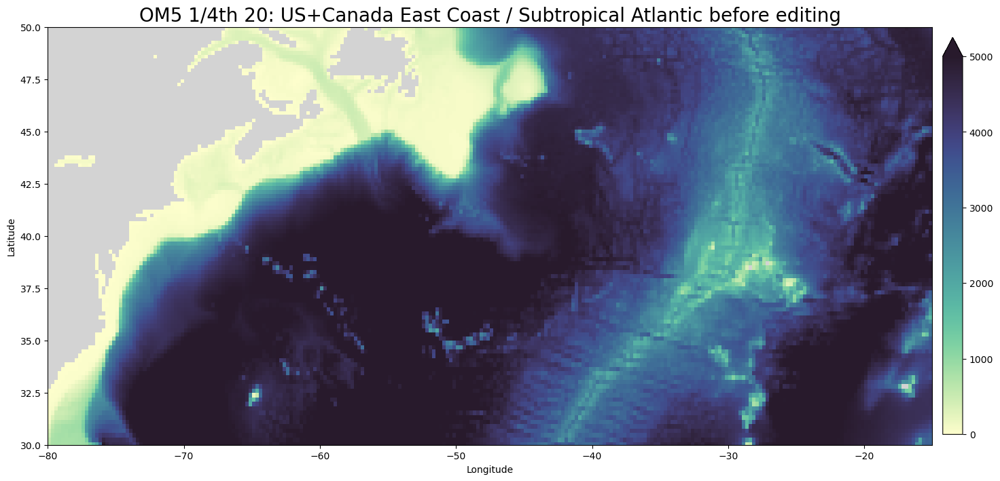

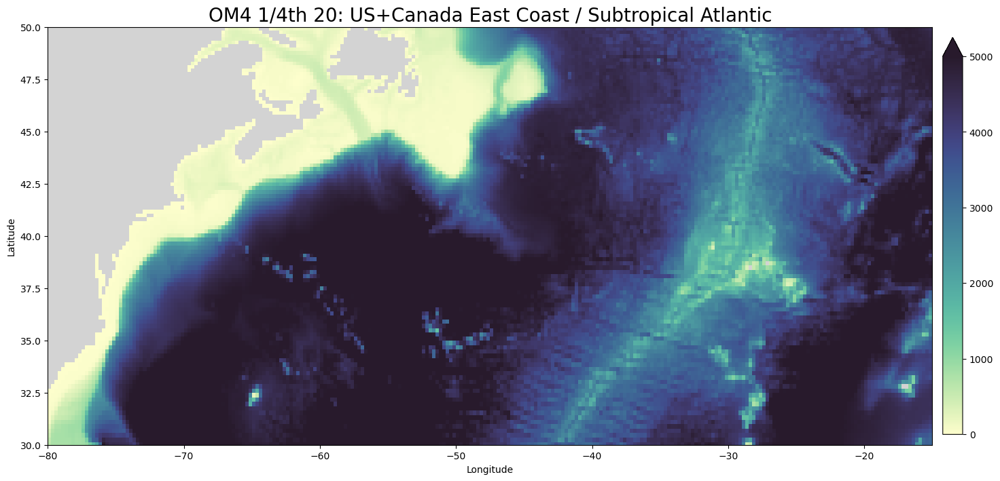

In [7]:
# Broad view of region before edits 

broadview(OM4,OM5,
          (Region_Boundaries[2],Region_Boundaries[3]),
          (Region_Boundaries[0],Region_Boundaries[1]),
          0, 5000, Region_Name, om4=True, new=False)

(-74.6, 10.8)
Gebco (js:je,is:ie) = 28799:31199,52799:55392
OM4 model (js:je,is:ie) = 628:679,878:924
OM5 model (js:je,is:ie) = 709:760,878:924
Using xlim = (-80.0, -69.19999999999999) ylim = (30.0, 40.0)
(-74.6, 10.8)
Gebco (js:je,is:ie) = 31199:33599,52799:55392
OM4 model (js:je,is:ie) = 677:736,878:924
OM5 model (js:je,is:ie) = 758:817,878:924
Using xlim = (-80.0, -69.19999999999999) ylim = (40.0, 50.0)
(-63.8, 10.8)
Gebco (js:je,is:ie) = 28799:31199,55391:57984
OM4 model (js:je,is:ie) = 628:679,922:967
OM5 model (js:je,is:ie) = 709:760,922:967
Using xlim = (-69.2, -58.4) ylim = (30.0, 40.0)
(-63.8, 10.8)
Gebco (js:je,is:ie) = 31199:33599,55391:57984
OM4 model (js:je,is:ie) = 677:736,922:967
OM5 model (js:je,is:ie) = 758:817,922:967
Using xlim = (-69.2, -58.4) ylim = (40.0, 50.0)
(-52.9, 10.8)
Gebco (js:je,is:ie) = 28799:31199,58007:60599
OM4 model (js:je,is:ie) = 628:679,965:1010
OM5 model (js:je,is:ie) = 709:760,965:1010
Using xlim = (-58.3, -47.5) ylim = (30.0, 40.0)
(-52.9, 10.8

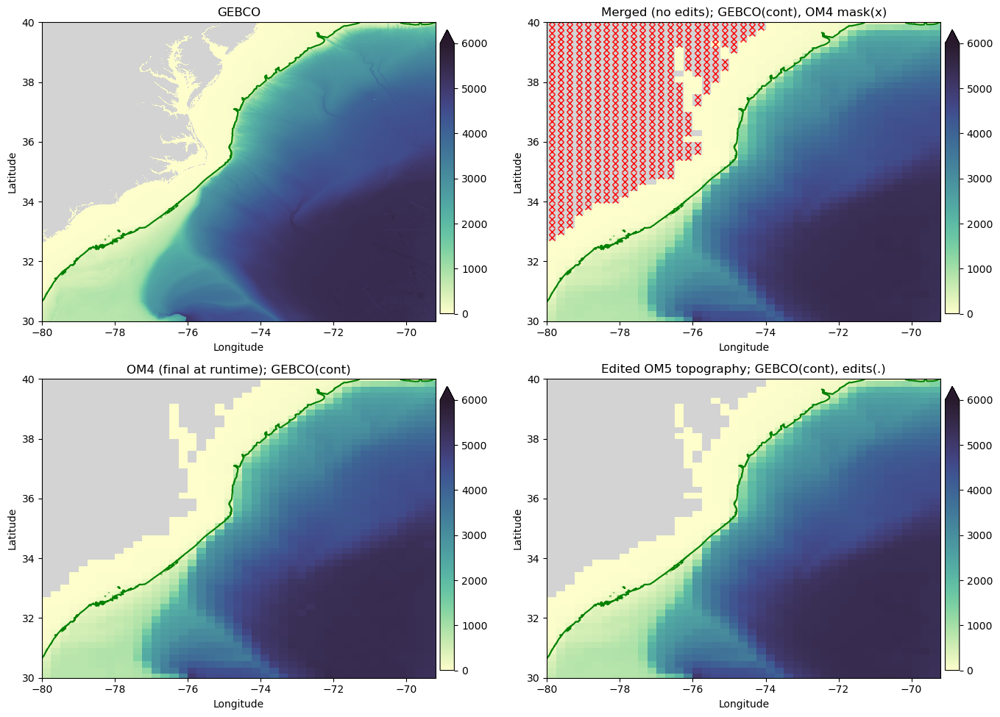

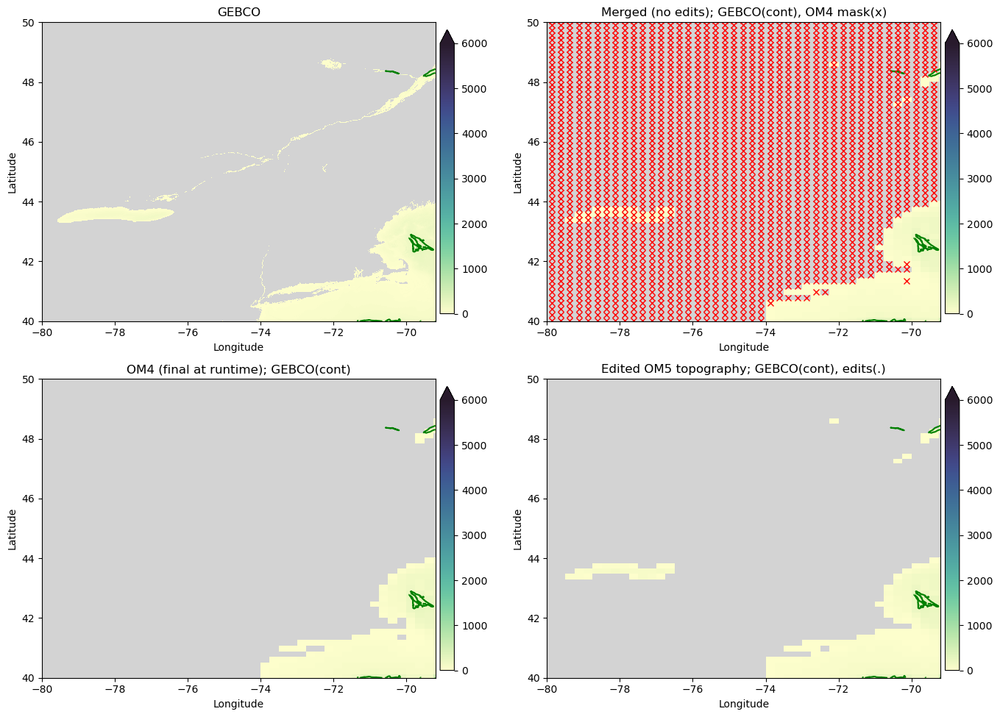

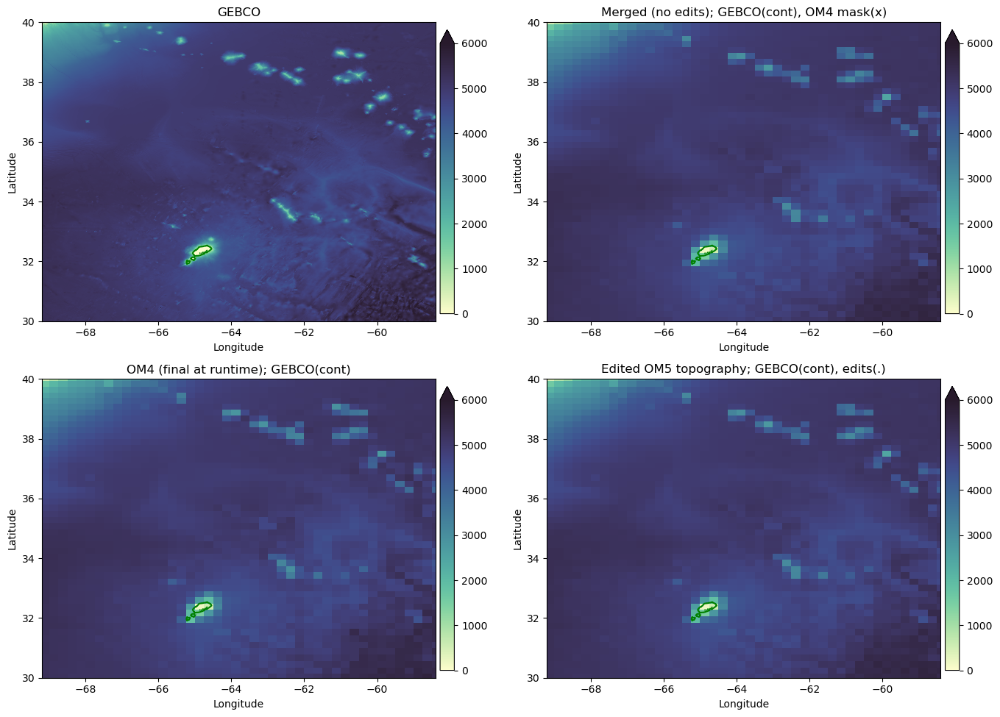

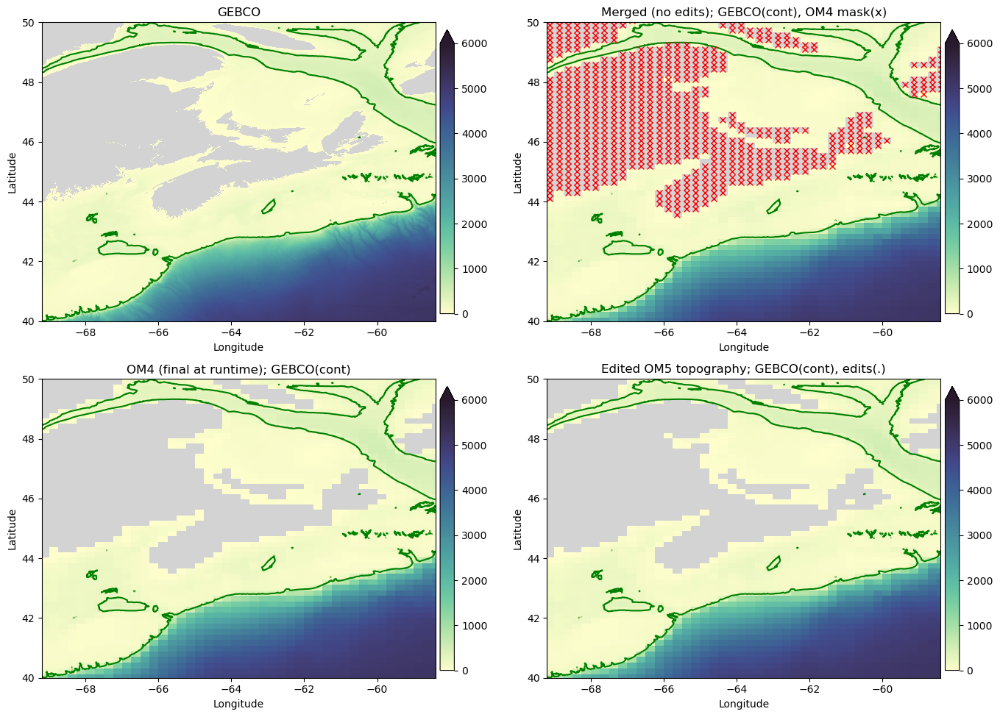

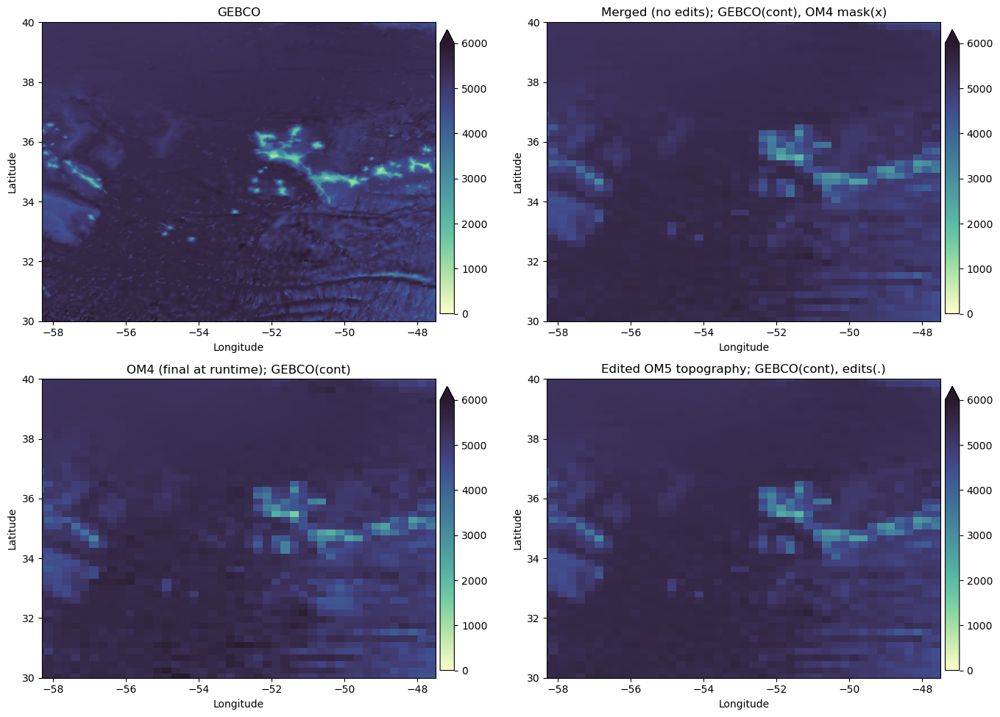

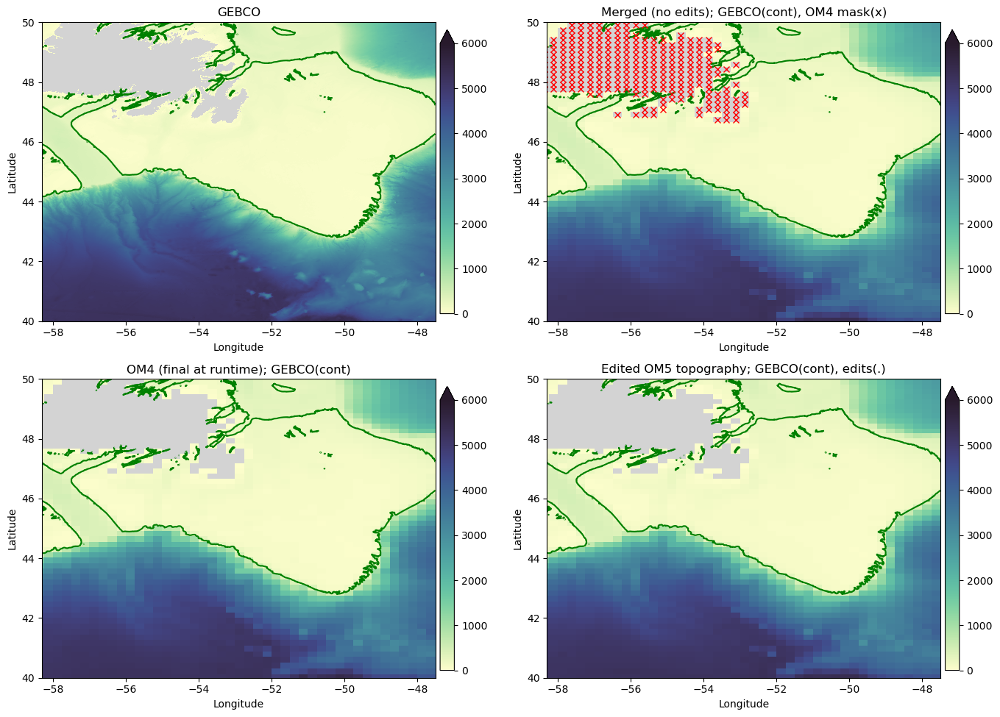

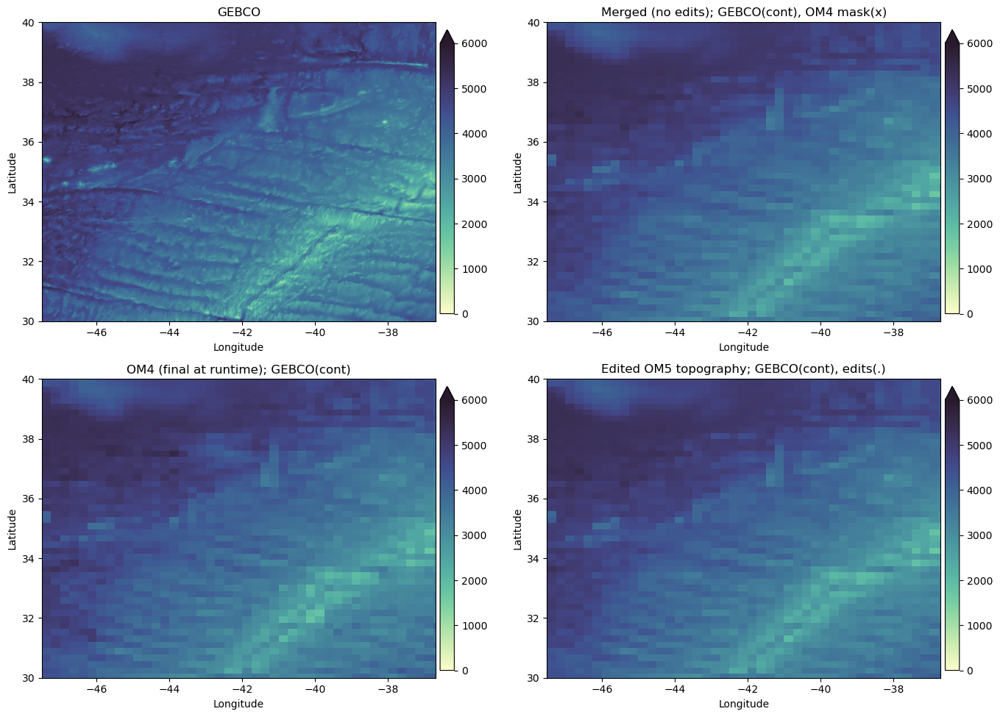

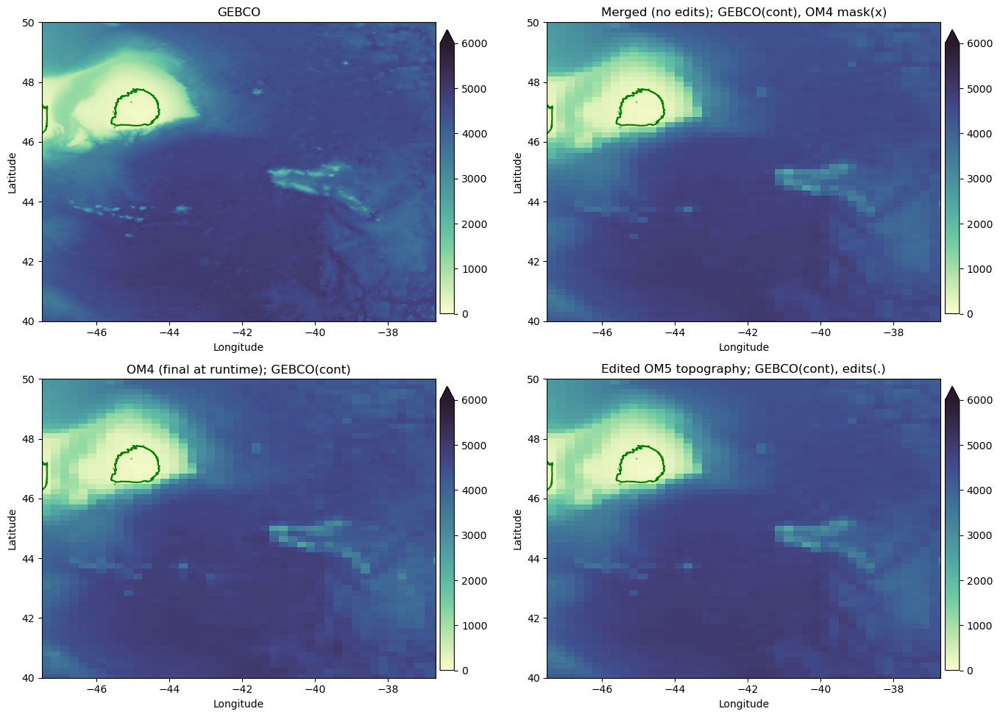

In [8]:
xint = divide_interval(Region_Boundaries[2],Region_Boundaries[3],6)
yint = divide_interval(Region_Boundaries[0],Region_Boundaries[1],2)

depths = [6000, 6000, 6000, 6000, 6000, 6000, 6000, 6000]

count = 0
for nx,xrng in enumerate(xint):
    for ny, yrng in enumerate(yint):
        print(xrng)
        try:
            region = Region(xrng[0], yrng[0], width_lon=xrng[1], width_lat=yrng[1])
            map_region(region, 0, depths[count], GEBCO, OM4, OM5, '', gebco_contours=[250],text_depths=False)
            count+=1
        except:
            pass

Gebco (js:je,is:ie) = 28367:28847,49019:49499
OM4 model (js:je,is:ie) = 620:631,815:825
OM5 model (js:je,is:ie) = 701:712,815:825
Using xlim = (-95.75, -93.75) ylim = (28.2, 30.2)


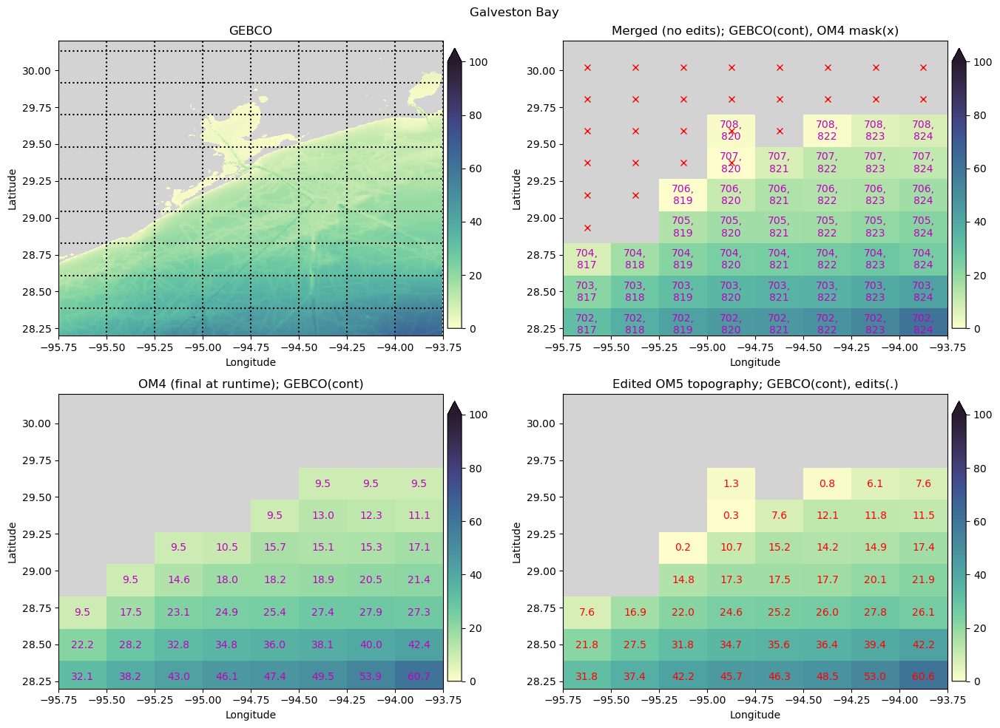

In [9]:
# Check Galveston Bay (no edits)

region = Region(-94.75, 29.2, width_lon=2, width_lat=2.0)
map_region(region, 0, 100, GEBCO, OM4, OM5, 'Galveston Bay', gebco_contours=[250] )

Gebco (js:je,is:ie) = 28487:28967,50256:50736
OM4 model (js:je,is:ie) = 622:633,836:846
OM5 model (js:je,is:ie) = 703:714,836:846
Using xlim = (-90.6, -88.6) ylim = (28.7, 30.7)


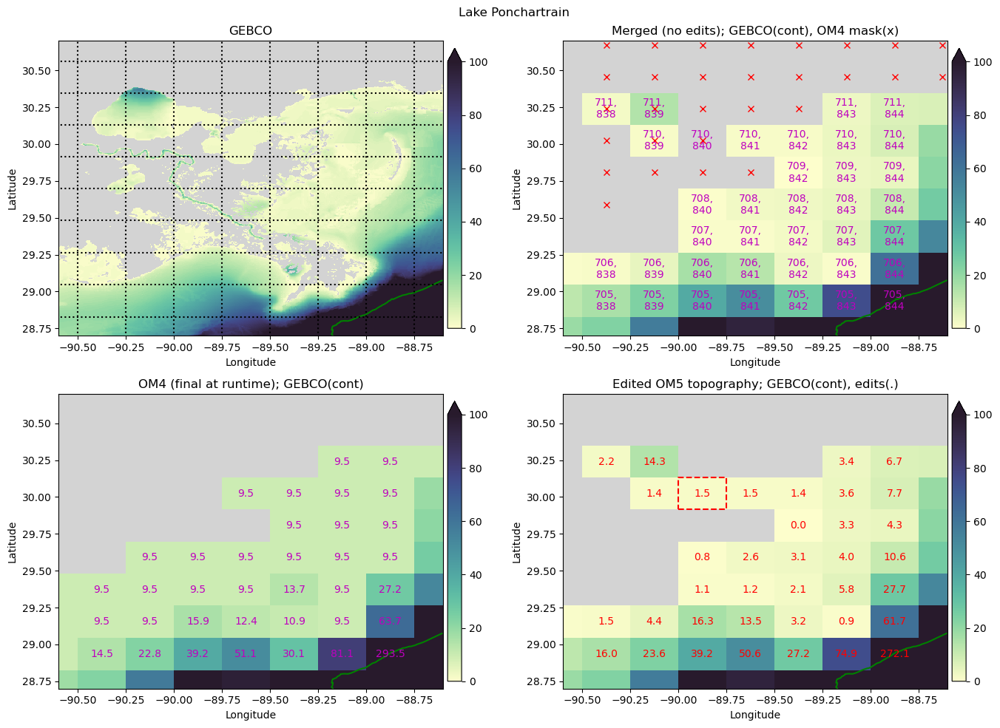

In [10]:
# Connected Lake Ponchartrain

region = Region(-89.6, 29.7, width_lon=2, width_lat=2.0)

OM5.reset(region)
OM5.depth[710,840] = 1.5

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Lake Ponchartrain', gebco_contours=[250] )

Gebco (js:je,is:ie) = 28607:29087,50736:51216
OM4 model (js:je,is:ie) = 624:635,844:854
OM5 model (js:je,is:ie) = 705:716,844:854
Using xlim = (-88.6, -86.6) ylim = (29.2, 31.2)


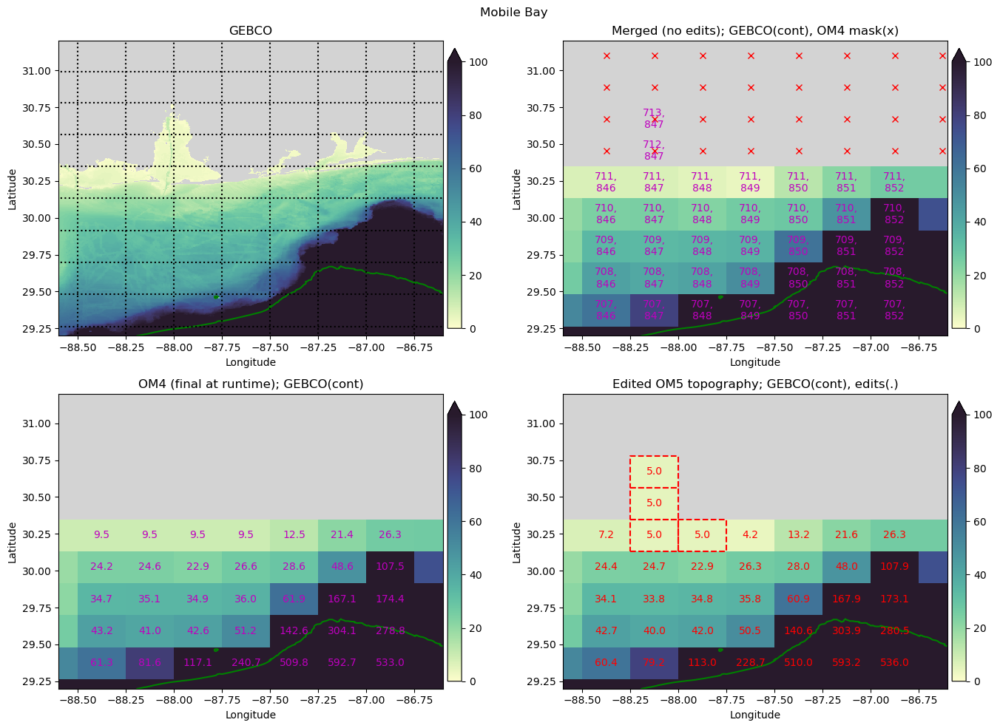

In [11]:
# Inserted Mobile Bay

region = Region(-87.6, 30.2, width_lon=2, width_lat=2.0)

OM5.reset(region)
OM5.depth[711,847] = 5.0
OM5.depth[711,848] = 5.0
OM5.depth[712,847] = 5.0
OM5.depth[713,847] = 5.0

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Mobile Bay', gebco_contours=[250] )

Gebco (js:je,is:ie) = 27959:28439,51767:52247
OM4 model (js:je,is:ie) = 612:623,861:871
OM5 model (js:je,is:ie) = 693:704,861:871
Using xlim = (-84.3, -82.3) ylim = (26.5, 28.5)


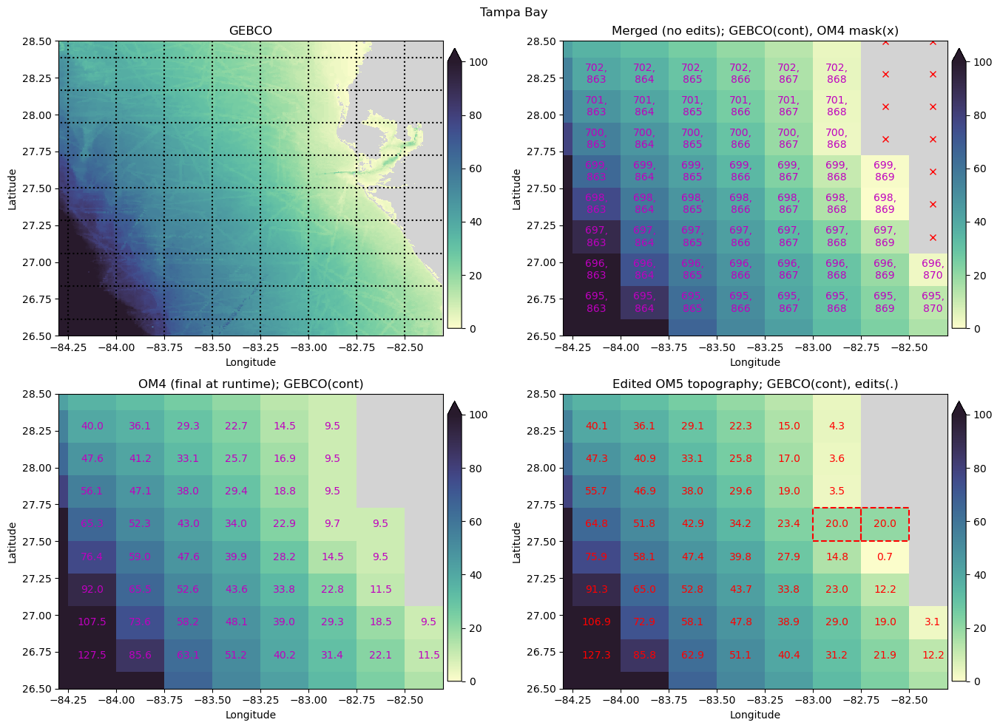

In [12]:
# Deepened Tampa Bay

region = Region(-83.3, 27.5, width_lon=2, width_lat=2.0)

OM5.reset(region)
OM5.depth[699,868] = 20.0
OM5.depth[699,869] = 20.0

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Tampa Bay', gebco_contours=[250] )

Gebco (js:je,is:ie) = 29879:30599,53399:54119
OM4 model (js:je,is:ie) = 649:666,888:902
OM5 model (js:je,is:ie) = 730:747,888:902
Using xlim = (-77.5, -74.5) ylim = (34.5, 37.5)


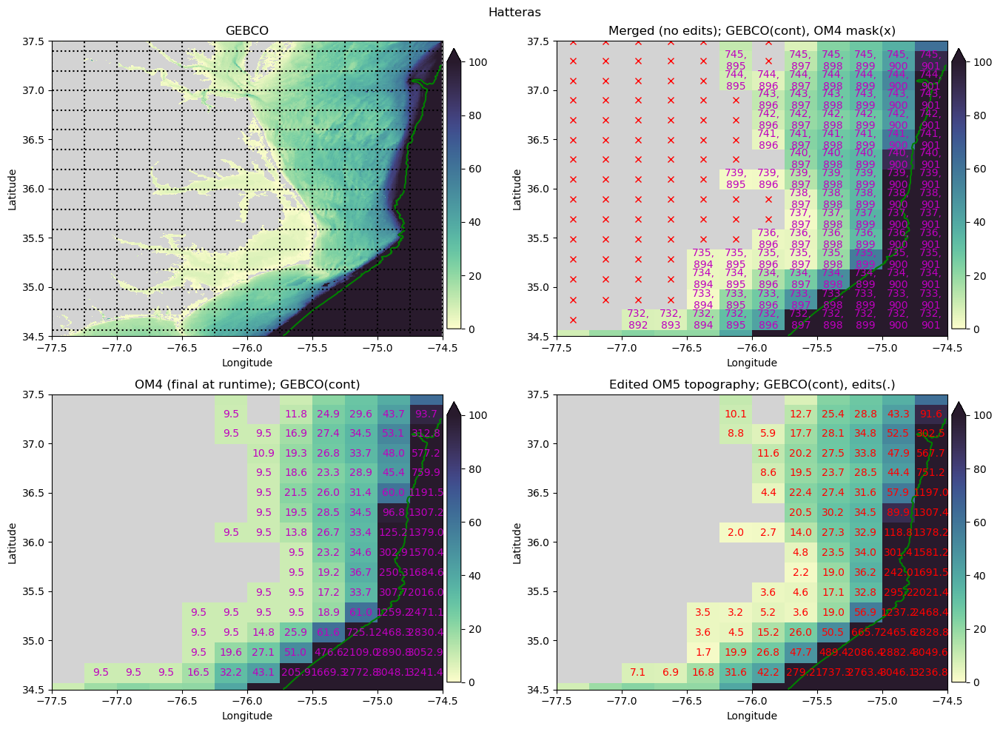

In [13]:
# Check Hatteras (no edits)

region = Region(-76, 36., width_lon=3, width_lat=3.0)
map_region(region, 0, 100, GEBCO, OM4, OM5, 'Hatteras', gebco_contours=[250] )

Gebco (js:je,is:ie) = 30431:31151,53376:54096
OM4 model (js:je,is:ie) = 661:678,888:902
OM5 model (js:je,is:ie) = 742:759,888:902
Using xlim = (-77.6, -74.6) ylim = (36.8, 39.8)


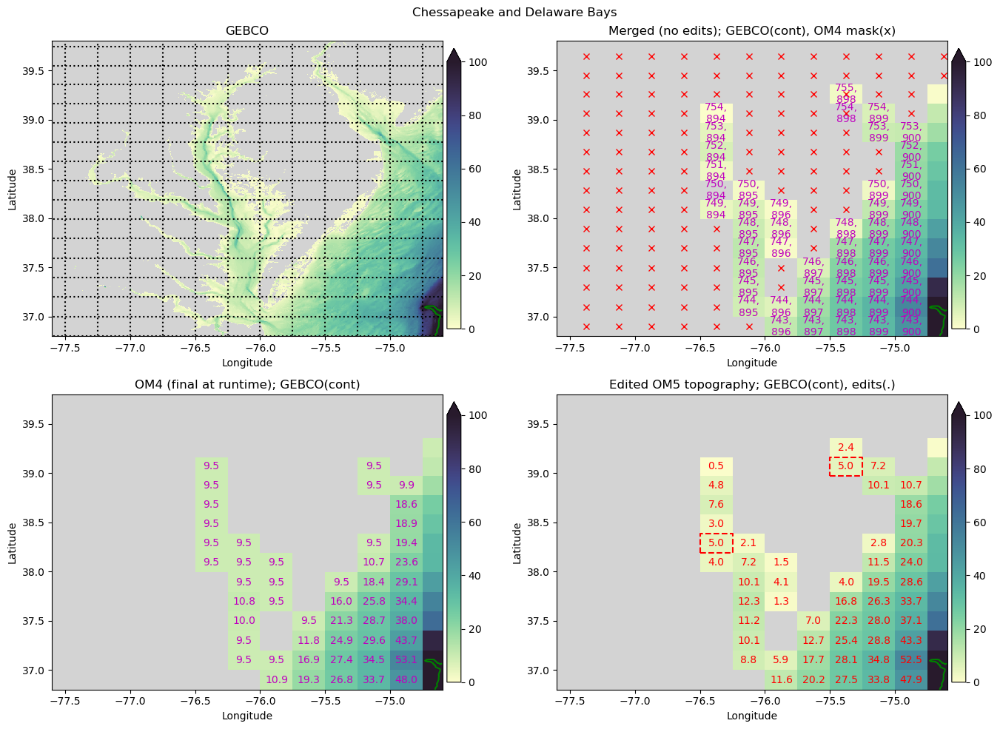

In [14]:
# Chessapeake & Delaware (Added a point in Delaware Bay)

region = Region(-76.1, 38.3, width_lon=3, width_lat=3.0)

OM5.reset(region)

OM5.depth[754,898] = 5.0
OM5.depth[750,894] = 5.0

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Chessapeake and Delaware Bays', gebco_contours=[250] )

Gebco (js:je,is:ie) = 30959:31679,54119:54839
OM4 model (js:je,is:ie) = 672:689,900:914
OM5 model (js:je,is:ie) = 753:770,900:914
Using xlim = (-74.5, -71.5) ylim = (39.0, 42.0)


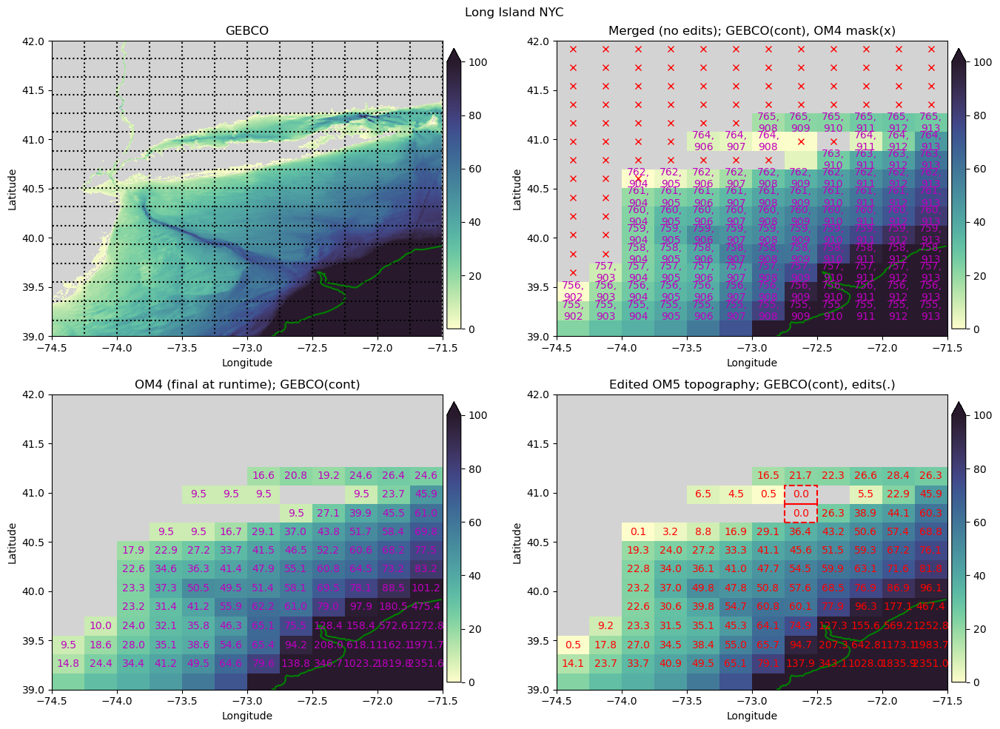

In [15]:

# NYC Long Island (Removed break in Long Island)

region = Region(-73.0, 40.5, width_lon=3, width_lat=3.0)

OM5.reset(region)
OM5.depth[764,909] = 0.0
OM5.depth[763,909] = 0.0

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Long Island NYC', gebco_contours=[250] )

Gebco (js:je,is:ie) = 31308:31908,54707:55307
OM4 model (js:je,is:ie) = 679:695,910:922
OM5 model (js:je,is:ie) = 760:776,910:922
Using xlim = (-72.05, -69.55) ylim = (40.45, 42.95)


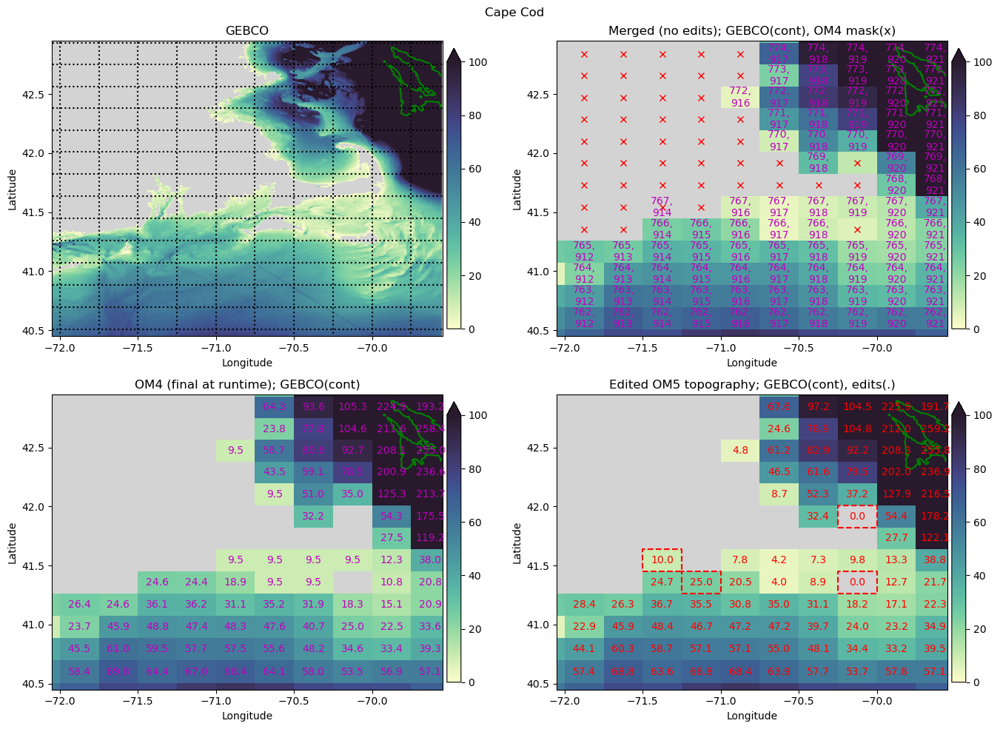

In [16]:
# Cape Cod

region = Region(-70.8, 41.7, width_lon=2.5, width_lat=2.5)

OM5.reset(region)
OM5.depth[769,919] = 0.0
OM5.depth[766,919] = 0.0  # Martha's Vineyard
OM5.depth[766,915] = 25.0  # Naraganset Bay
OM5.depth[767,914] = 10.0  # Naraganset Bay

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Cape Cod', gebco_contours=[250] )

Gebco (js:je,is:ie) = 32051:32651,55883:56483
OM4 model (js:je,is:ie) = 696:712,930:942
OM5 model (js:je,is:ie) = 777:793,930:942
Using xlim = (-67.15, -64.65) ylim = (43.55, 46.05)


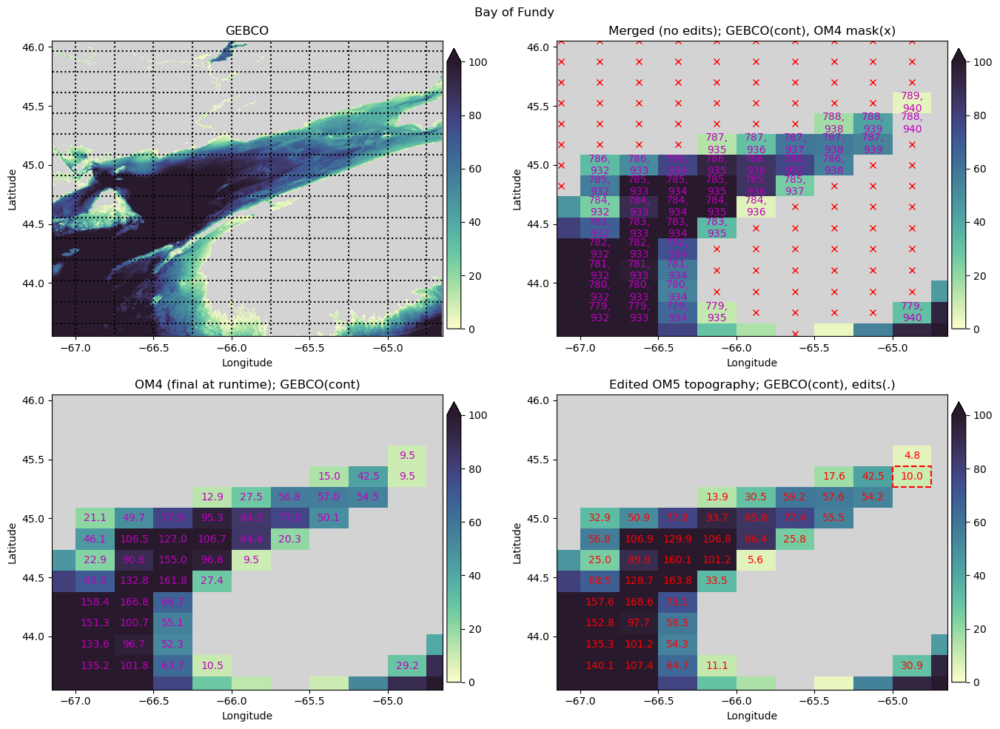

In [17]:
# Bay of Fundy

region = Region(-65.9, 44.8, width_lon=2.5, width_lat=2.5)

OM5.reset(region)
OM5.depth[788,940] = 10.0

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Bay of Fundy', gebco_contours=[250] )

Gebco (js:je,is:ie) = 32388:32988,56483:57084
OM4 model (js:je,is:ie) = 704:720,940:952
OM5 model (js:je,is:ie) = 785:801,940:952
Using xlim = (-64.65, -62.15) ylim = (44.95, 47.45)


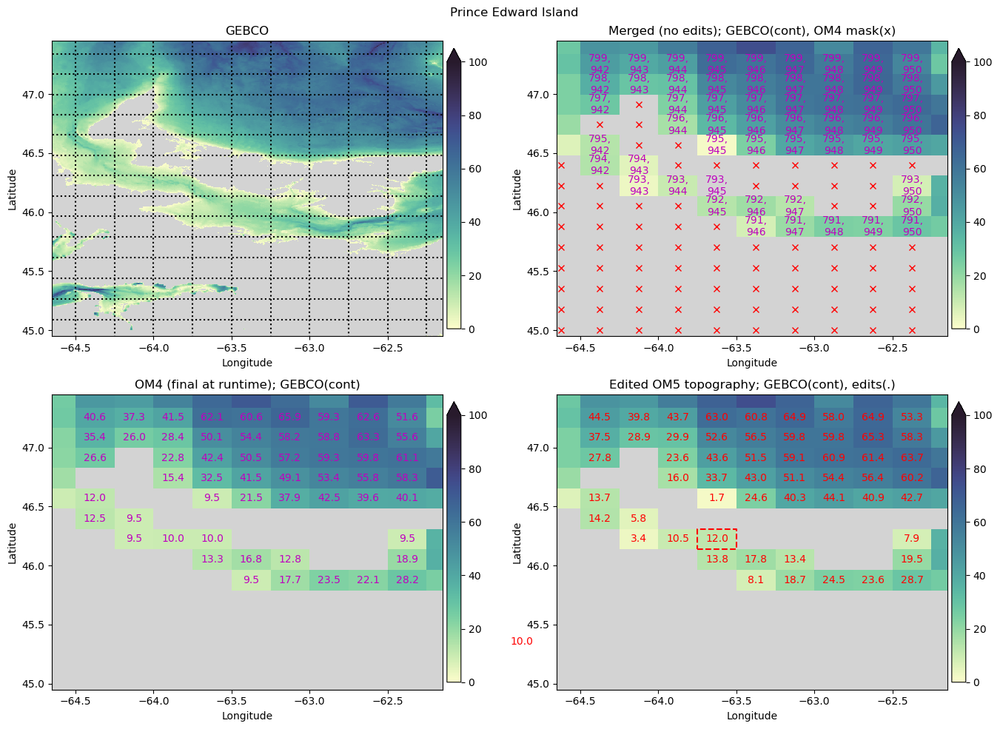

In [18]:
# Prince Edward Island

region = Region(-63.4, 46.2, width_lon=2.5, width_lat=2.5)

OM5.reset(region)
OM5.depth[793,945] = 12.0

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Prince Edward Island', gebco_contours=[250] )

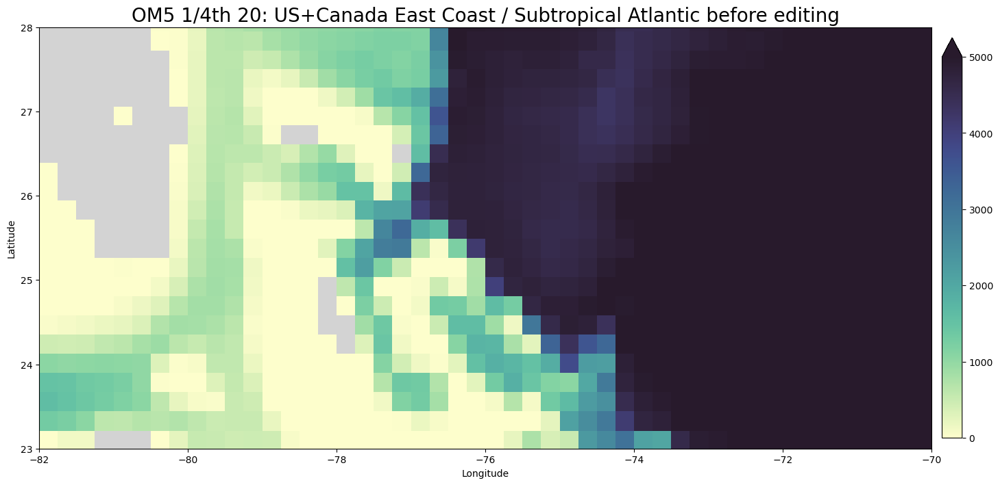

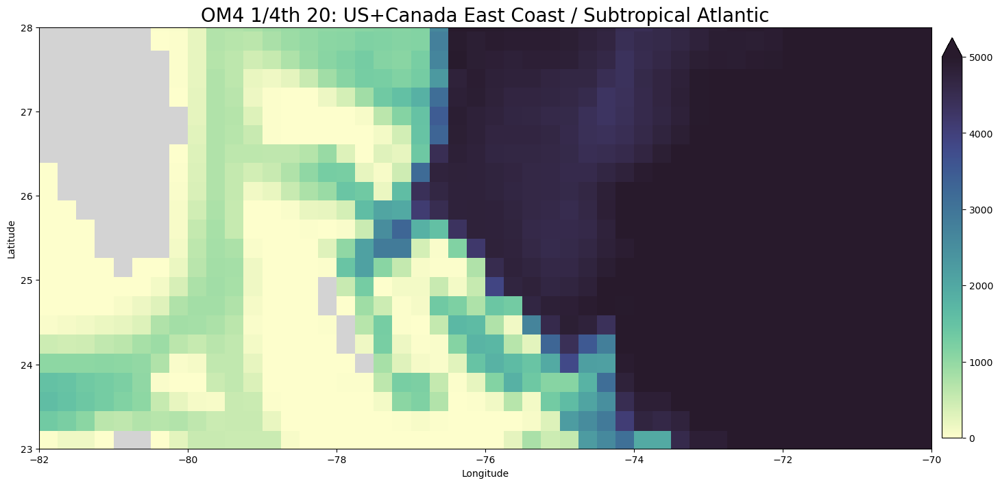

In [19]:
# Broad view of region before edits 

broadview(OM4,OM5,
          (-82,-70), (23,28),
          0, 5000, Region_Name, om4=True, new=False)

Gebco (js:je,is:ie) = 27419:27899,52319:52799
OM4 model (js:je,is:ie) = 602:613,870:880
OM5 model (js:je,is:ie) = 683:694,870:880
Using xlim = (-82.0, -80.0) ylim = (24.25, 26.25)


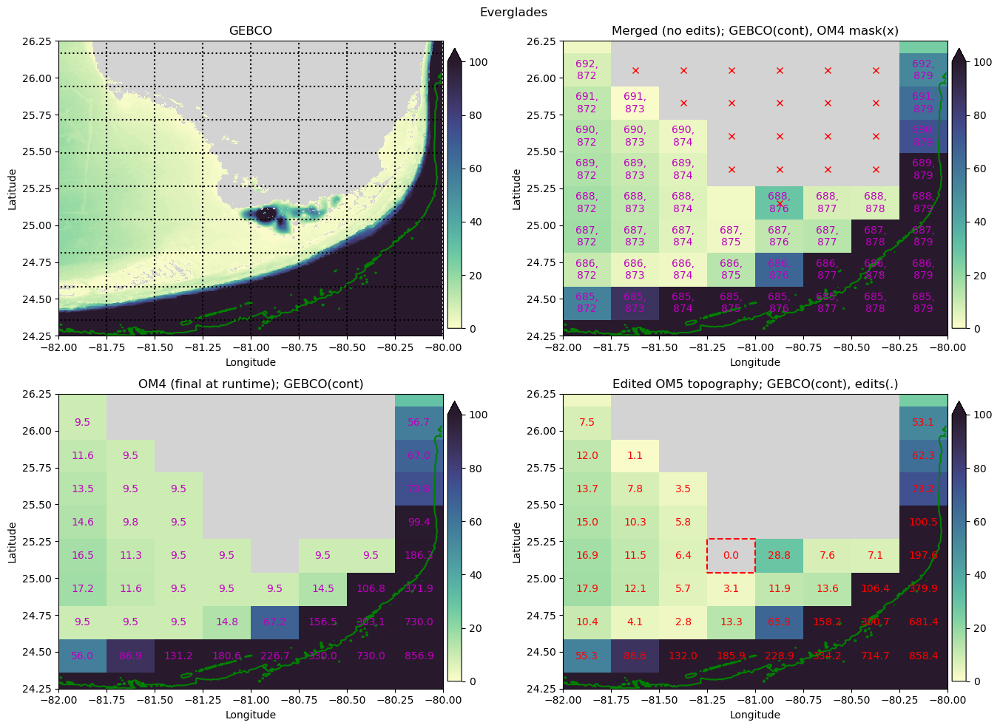

In [20]:
# Everglades

region = Region(-81.0, 25.25, width_lon=2, width_lat=2)

OM5.reset(region)
OM5.depth[688,875] = 0.0

map_region(region, 0, 100, GEBCO, OM4, OM5, 'Everglades', gebco_contours=[250] )

Gebco (js:je,is:ie) = 27719:28199,53027:53579
OM4 model (js:je,is:ie) = 608:618,882:893
OM5 model (js:je,is:ie) = 689:699,882:893
Using xlim = (-79.05000000000001, -76.75) ylim = (25.5, 27.5)


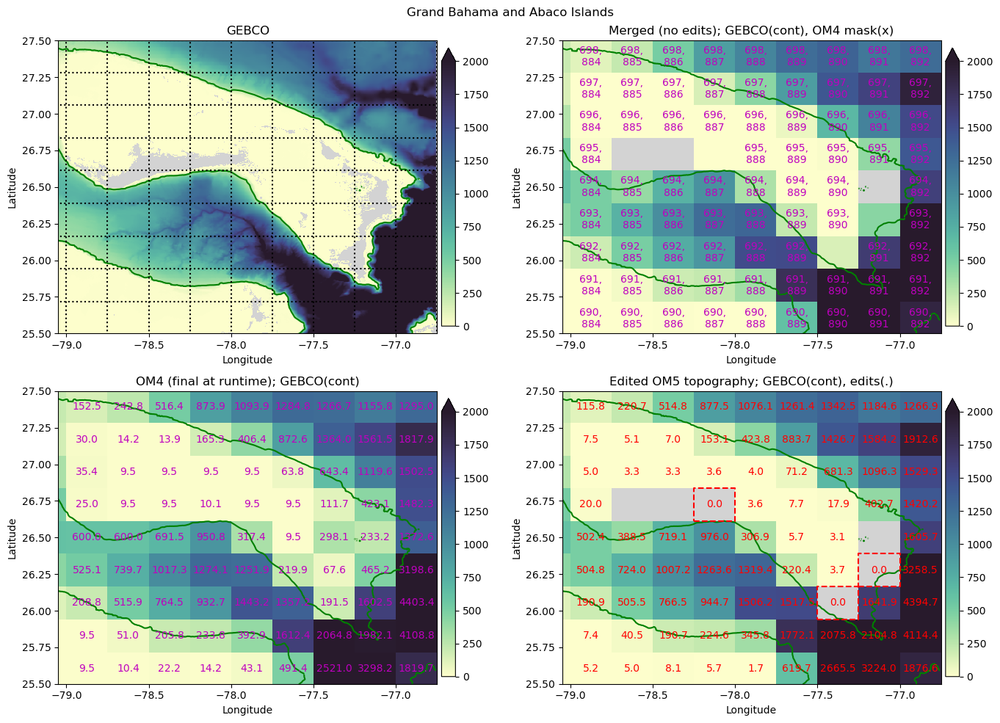

In [21]:
# Grand Bahama and Abaco Islands

region = Region(-77.9, 26.5, width_lon=2.3, width_lat=2.0)

OM5.depth[695,887] = 0
OM5.depth[693,891] = 0
OM5.depth[692,890] = 0

map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Grand Bahama and Abaco Islands', gebco_contours=[250] )

Gebco (js:je,is:ie) = 27167:27647,53063:53543
OM4 model (js:je,is:ie) = 597:608,883:893
OM5 model (js:je,is:ie) = 678:689,883:893
Using xlim = (-78.9, -76.9) ylim = (23.2, 25.2)


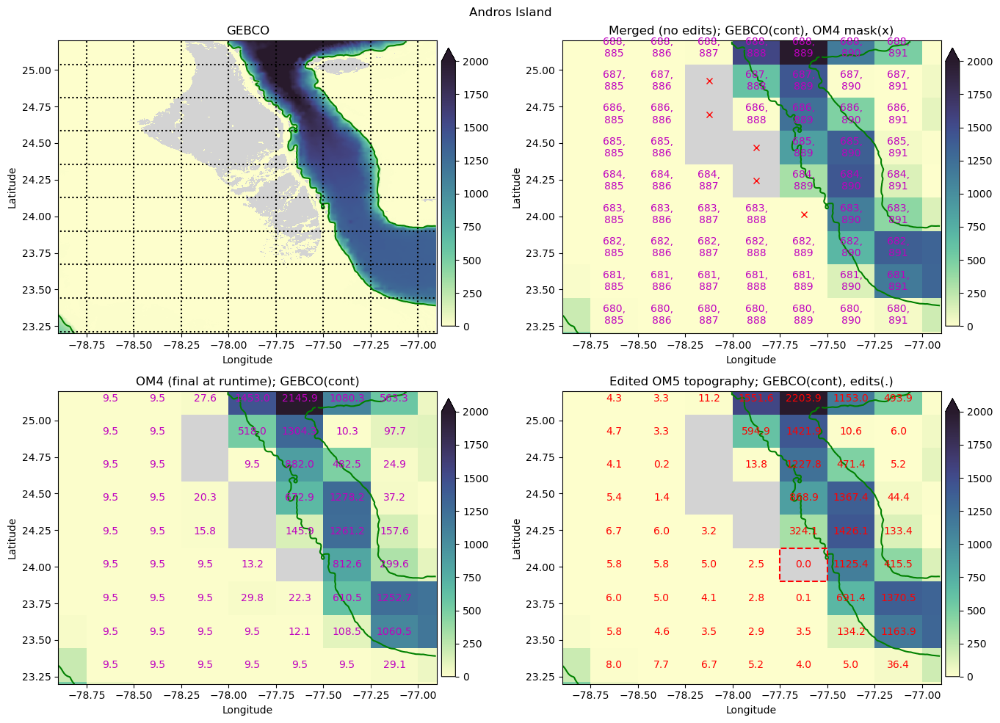

In [22]:
# Andros Island

region = Region(-77.9, 24.2, width_lon=2.0, width_lat=2.0)

OM5.reset(region)
OM5.depth[683,889] = 0
#OM5.depth[693,891] = 0
#OM5.depth[692,890] = 0

map_region(region, 0, 2000, GEBCO, OM4, OM5, 'Andros Island', gebco_contours=[250] )

Gebco (js:je,is:ie) = 26399:28319,52967:54887
OM4 model (js:je,is:ie) = 584:621,881:915
OM5 model (js:je,is:ie) = 665:702,881:915
Using xlim = (-79.3, -71.3) ylim = (20.0, 28.0)


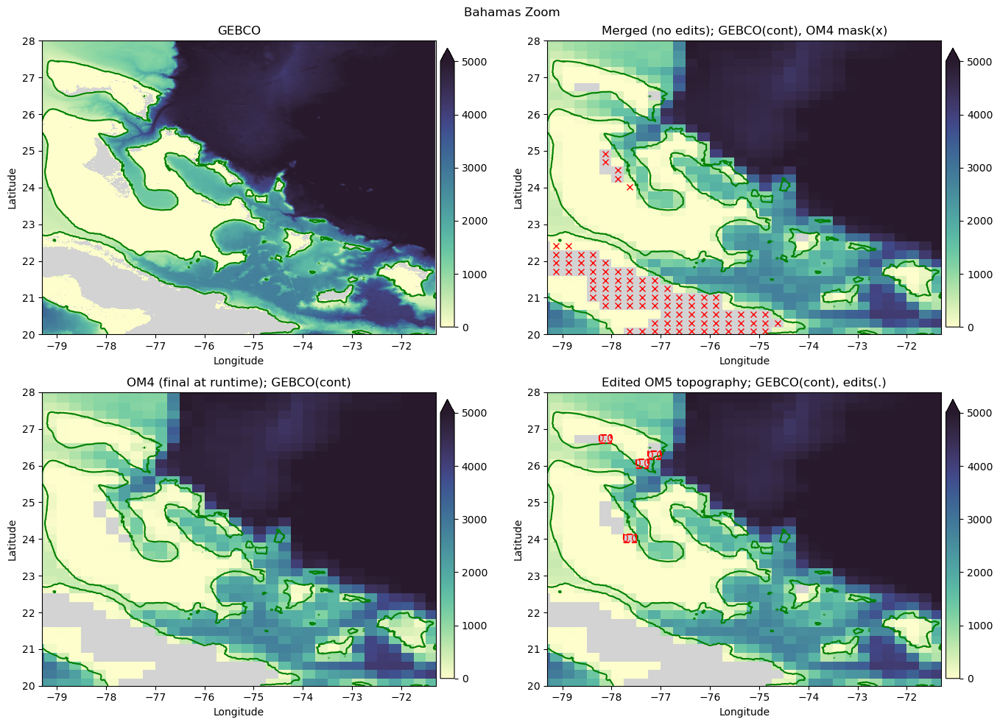

In [23]:
# Bahamas Zoom (before edits)

region = Region(-75.3, 24, width_lon=8.0, width_lat=8.0)
map_region(region, 0, 5000, GEBCO, OM4, OM5, 'Bahamas Zoom', gebco_contours=[250], text_depths=False )

Gebco (js:je,is:ie) = 26759:27239,53999:54479
OM4 model (js:je,is:ie) = 590:601,898:908
OM5 model (js:je,is:ie) = 671:682,898:908
Using xlim = (-75.0, -73.0) ylim = (21.5, 23.5)


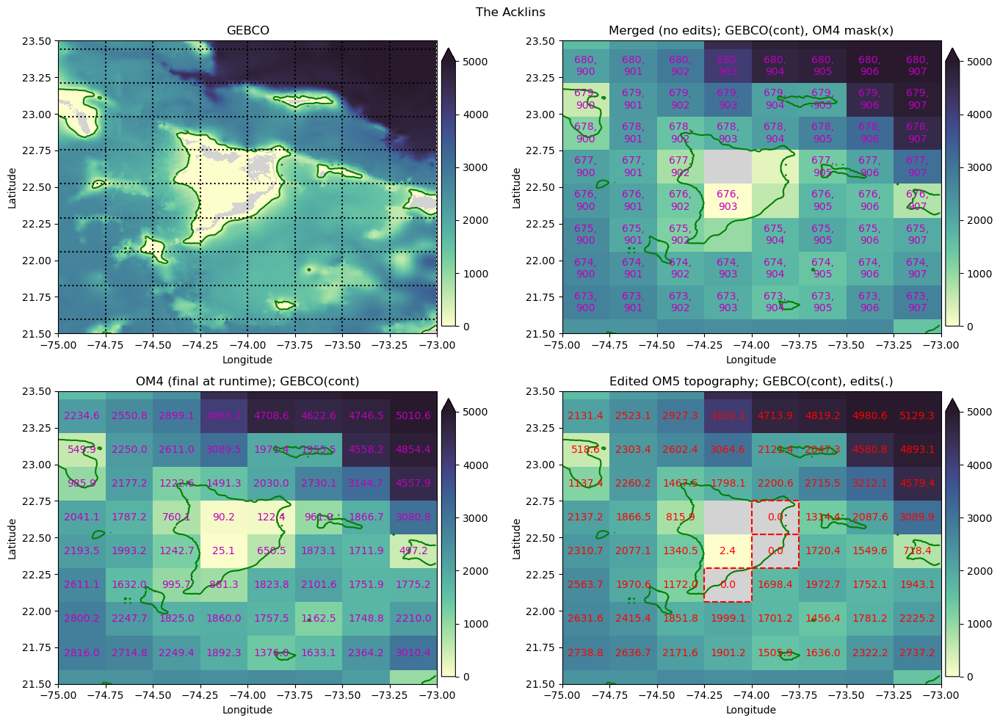

In [24]:
# The Acklins

region = Region(-74, 22.5, width_lon=2.0, width_lat=2.0)

OM5.depth[677,904] = 0
OM5.depth[676,904] = 0
OM5.depth[675,903] = 0

map_region(region, 0, 5000, GEBCO, OM4, OM5, 'The Acklins', gebco_contours=[250], text_depths=True )

Gebco (js:je,is:ie) = 26759:27239,54239:54719
OM4 model (js:je,is:ie) = 590:601,902:912
OM5 model (js:je,is:ie) = 671:682,902:912
Using xlim = (-74.0, -72.0) ylim = (21.5, 23.5)


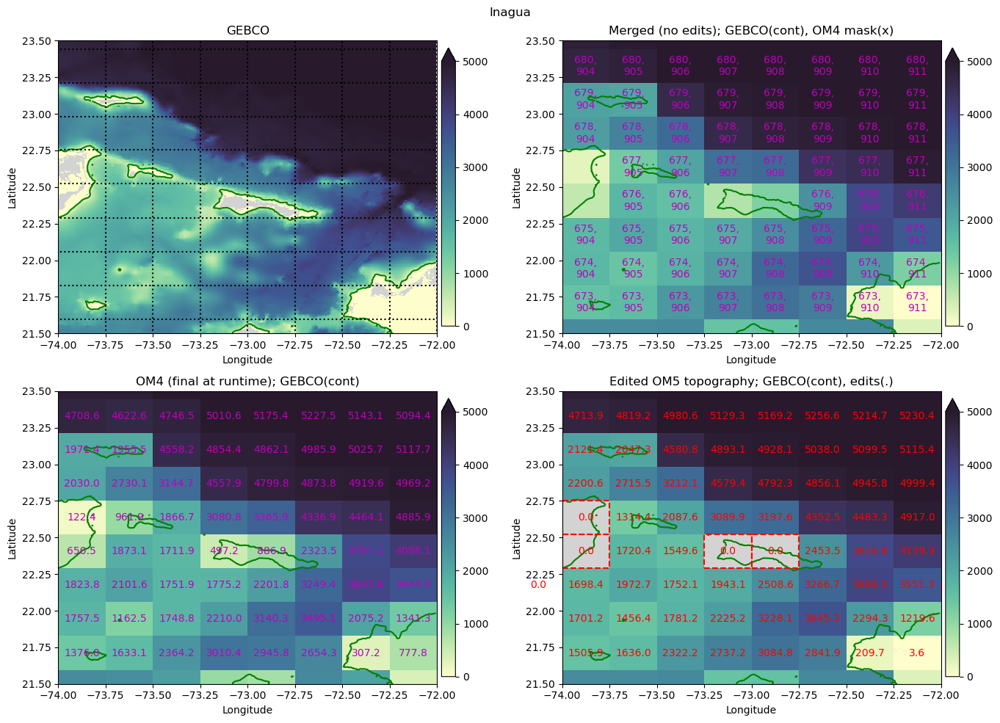

In [25]:
region = Region(-73, 22.5, width_lon=2.0, width_lat=2.0)

OM5.depth[676,907] = 0
OM5.depth[676,908] = 0

map_region(region, 0, 5000, GEBCO, OM4, OM5, 'Inagua', gebco_contours=[250], text_depths=True )

Gebco (js:je,is:ie) = 27059:27539,53819:54299
OM4 model (js:je,is:ie) = 595:606,895:905
OM5 model (js:je,is:ie) = 676:687,895:905
Using xlim = (-75.75, -73.75) ylim = (22.75, 24.75)


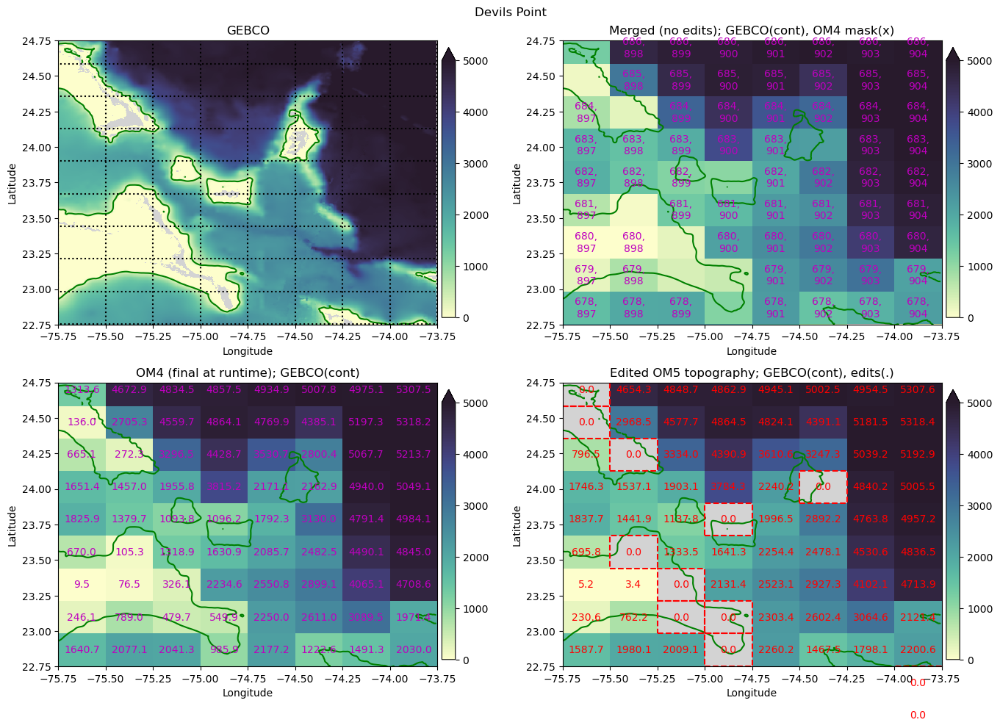

In [26]:
# Devils Point

region = Region(-74.75, 23.75, width_lon=2.0, width_lat=2.0)

OM5.depth[686,897] = 0
OM5.depth[685,897] = 0
OM5.depth[684,898] = 0

OM5.depth[682,900] = 0
OM5.depth[683,902] = 0

OM5.depth[678,900] = 0
OM5.depth[679,900] = 0
OM5.depth[679,899] = 0
OM5.depth[680,899] = 0
OM5.depth[681,898] = 0

map_region(region, 0, 5000, GEBCO, OM4, OM5, 'Devils Point', gebco_contours=[250], text_depths=True )

Gebco (js:je,is:ie) = 27192:27672,53639:54119
OM4 model (js:je,is:ie) = 598:609,892:902
OM5 model (js:je,is:ie) = 679:690,892:902
Using xlim = (-76.5, -74.5) ylim = (23.3, 25.3)


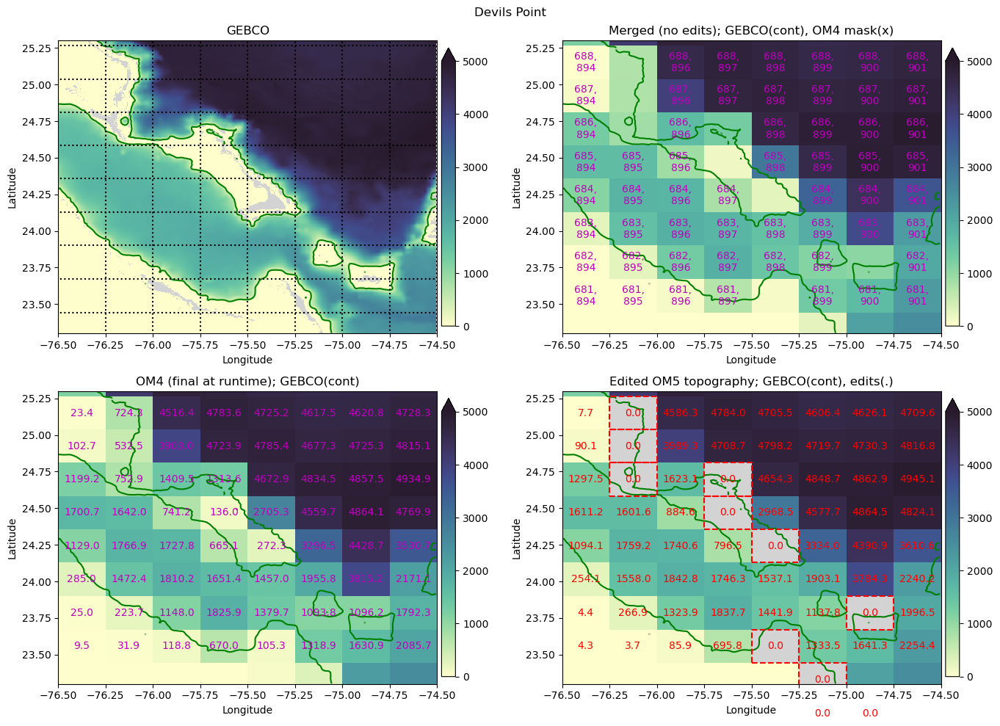

In [27]:
# Devils Point

region = Region(-75.5, 24.3, width_lon=2.0, width_lat=2.0)

OM5.depth[686,895] = 0
OM5.depth[687,895] = 0
OM5.depth[688,895] = 0

map_region(region, 0, 5000, GEBCO, OM4, OM5, 'Devils Point', gebco_contours=[250], text_depths=True )

Gebco (js:je,is:ie) = 27479:27959,53339:53819
OM4 model (js:je,is:ie) = 603:614,887:897
OM5 model (js:je,is:ie) = 684:695,887:897
Using xlim = (-77.75, -75.75) ylim = (24.5, 26.5)


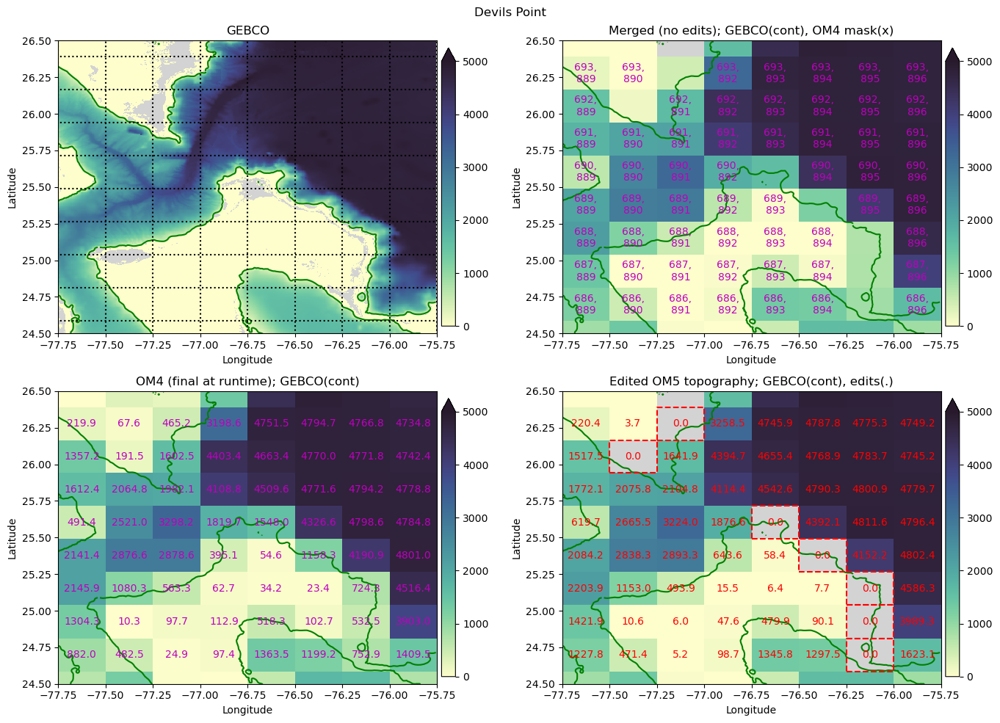

In [28]:
# Devils Point

region = Region(-76.75, 25.5, width_lon=2.0, width_lat=2.0)

OM5.depth[689,894] = 0
OM5.depth[690,893] = 0
#OM5.depth[688,895] = 0

map_region(region, 0, 5000, GEBCO, OM4, OM5, 'Devils Point', gebco_contours=[250], text_depths=True )

Gebco (js:je,is:ie) = 26352:26832,54119:54599
OM4 model (js:je,is:ie) = 583:593,900:910
OM5 model (js:je,is:ie) = 664:674,900:910
Using xlim = (-74.5, -72.5) ylim = (19.8, 21.8)


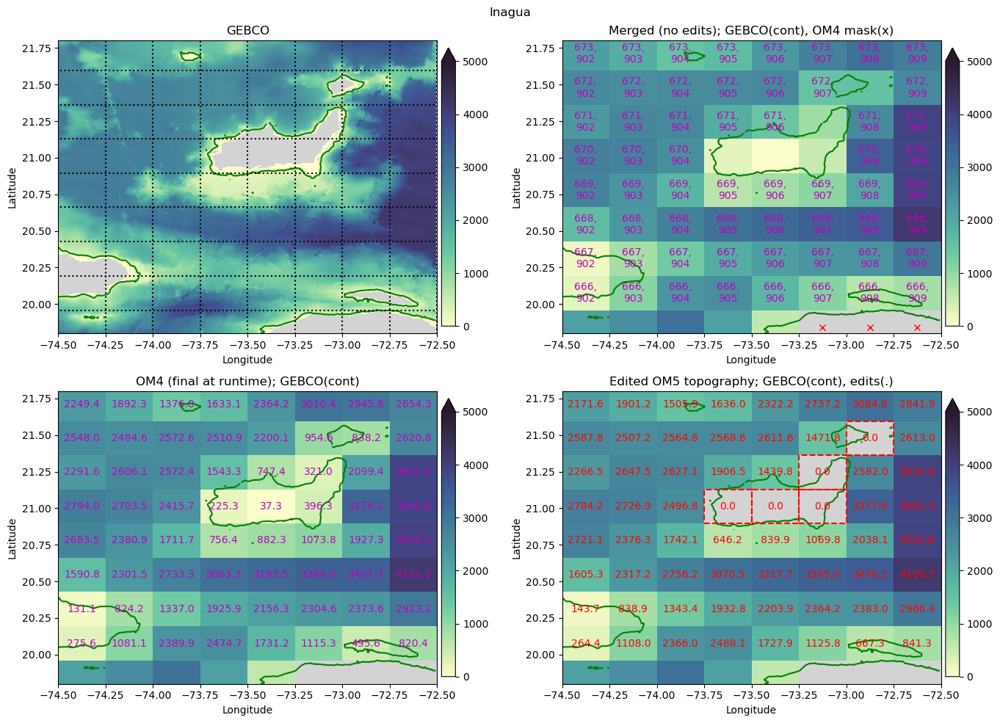

In [29]:
# Inagua

region = Region(-73.5, 20.8, width_lon=2.0, width_lat=2.0)

OM5.depth[670,905] = 0
OM5.depth[670,906] = 0
OM5.depth[670,907] = 0
OM5.depth[671,907] = 0
OM5.depth[672,908] = 0

map_region(region, 0, 5000, GEBCO, OM4, OM5, 'Inagua', gebco_contours=[250], text_depths=True )

Gebco (js:je,is:ie) = 26472:26952,54456:54936
OM4 model (js:je,is:ie) = 585:596,906:916
OM5 model (js:je,is:ie) = 666:677,906:916
Using xlim = (-73.1, -71.1) ylim = (20.3, 22.3)


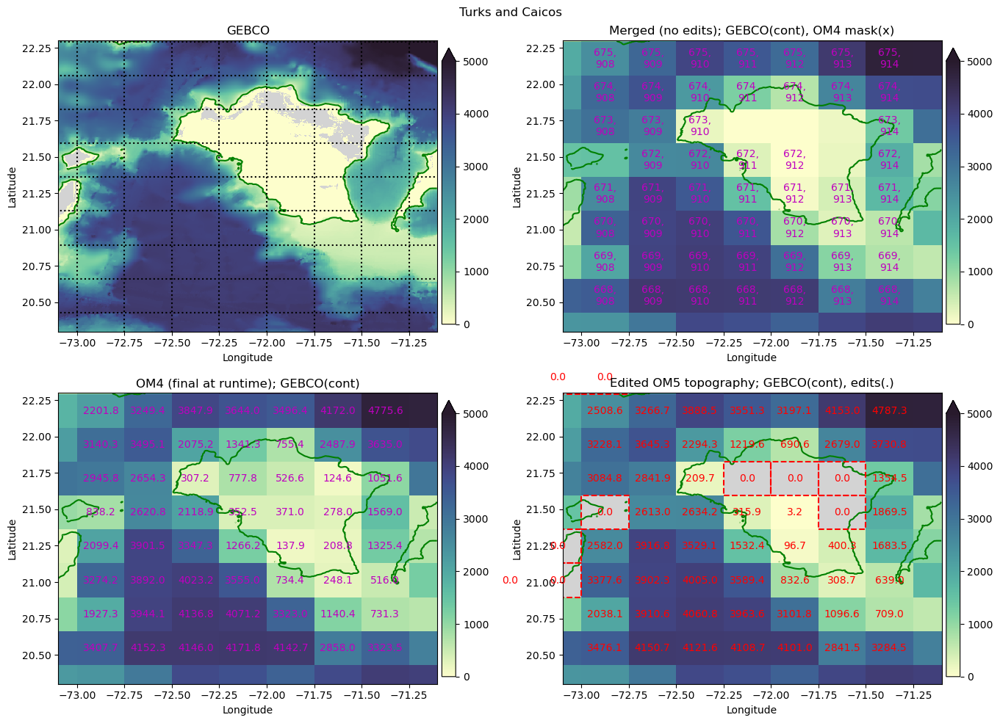

In [30]:
# Turks and Caicos

region = Region(-72.1, 21.3, width_lon=2.0, width_lat=2.0)

OM5.depth[672,913] = 0
OM5.depth[673,913] = 0
OM5.depth[673,912] = 0
OM5.depth[673,911] = 0

map_region(region, 0, 5000, GEBCO, OM4, OM5, 'Turks and Caicos', gebco_contours=[250], text_depths=True )

Gebco (js:je,is:ie) = 26399:28319,52967:54887
OM4 model (js:je,is:ie) = 584:621,881:915
OM5 model (js:je,is:ie) = 665:702,881:915
Using xlim = (-79.3, -71.3) ylim = (20.0, 28.0)


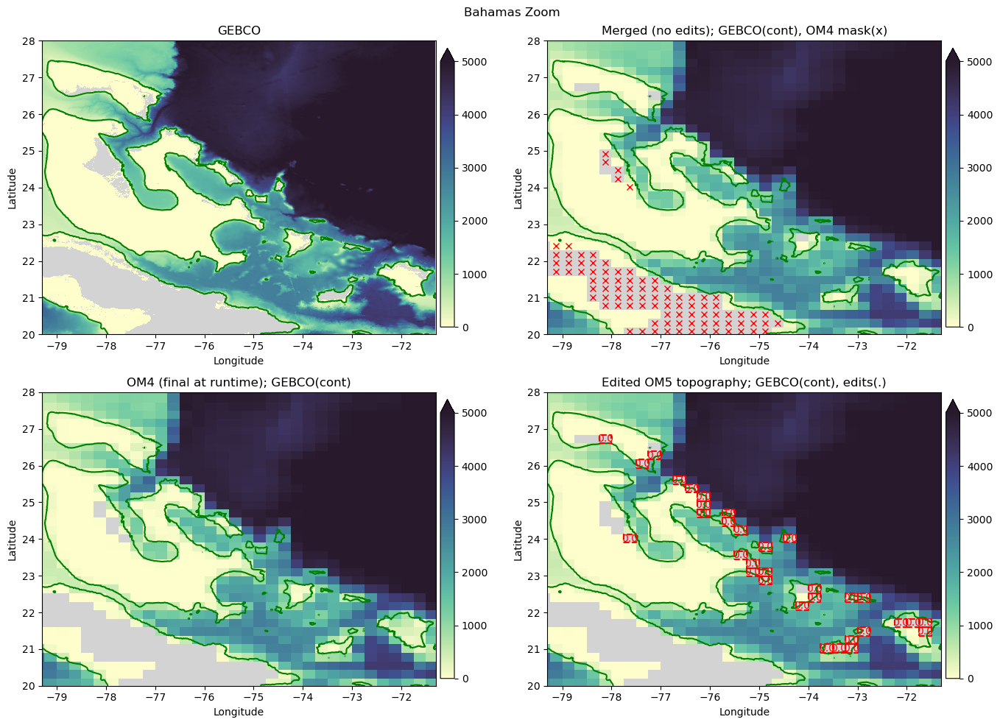

In [31]:
# Bahamas Zoom (after edits)

region = Region(-75.3, 24, width_lon=8.0, width_lat=8.0)
map_region(region, 0, 5000, GEBCO, OM4, OM5, 'Bahamas Zoom', gebco_contours=[250], text_depths=False )

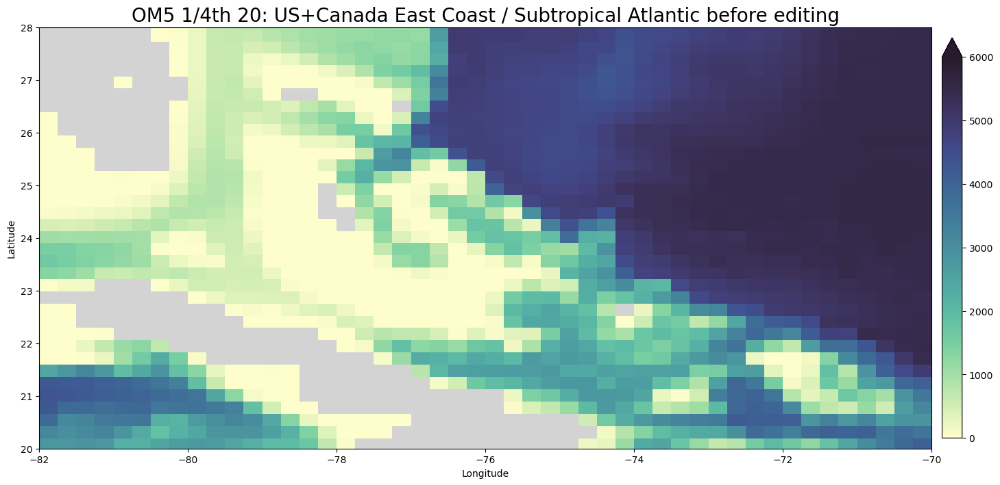

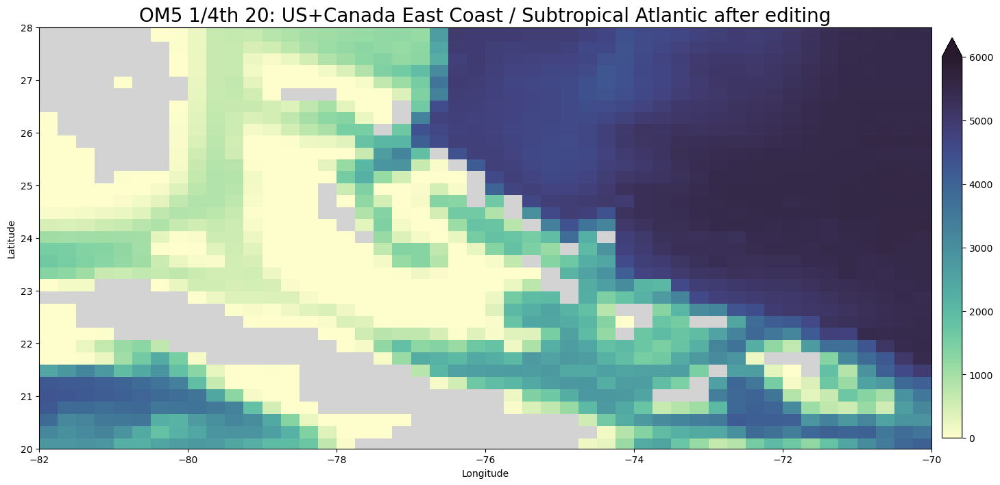

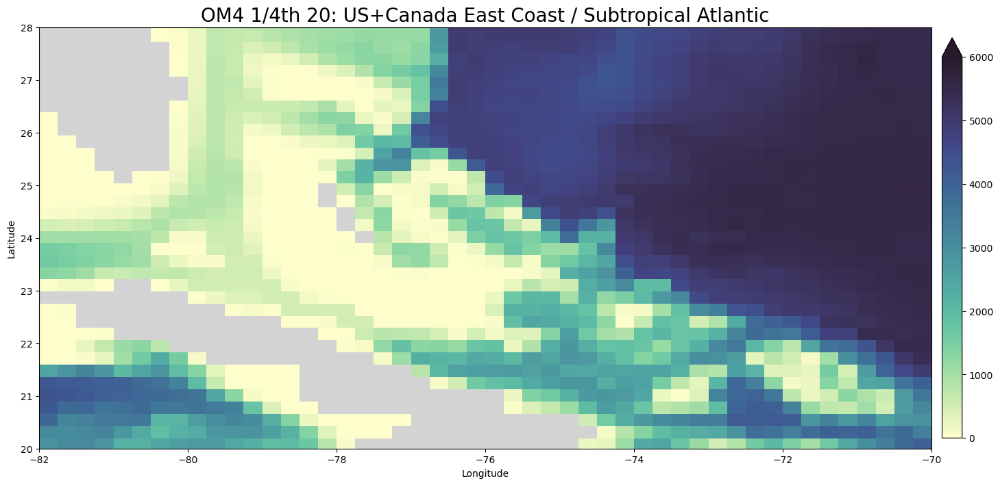

In [32]:
# Broad view of region after edits 

broadview(OM4,OM5,
          (-82,-70), (20,28),
          0, 6000, Region_Name, om4=True, new=True)

In [33]:
OM5.write_nc("om5_topo_edits_region_20.nc")

New Depth at jEdit=670 iEdit=905 set to 0.0
New Depth at jEdit=670 iEdit=906 set to 0.0
New Depth at jEdit=670 iEdit=907 set to 0.0
New Depth at jEdit=671 iEdit=907 set to 0.0
New Depth at jEdit=672 iEdit=908 set to 0.0
New Depth at jEdit=672 iEdit=913 set to 0.0
New Depth at jEdit=673 iEdit=911 set to 0.0
New Depth at jEdit=673 iEdit=912 set to 0.0
New Depth at jEdit=673 iEdit=913 set to 0.0
New Depth at jEdit=675 iEdit=903 set to 0.0
New Depth at jEdit=676 iEdit=904 set to 0.0
New Depth at jEdit=676 iEdit=907 set to 0.0
New Depth at jEdit=676 iEdit=908 set to 0.0
New Depth at jEdit=677 iEdit=904 set to 0.0
New Depth at jEdit=678 iEdit=900 set to 0.0
New Depth at jEdit=679 iEdit=899 set to 0.0
New Depth at jEdit=679 iEdit=900 set to 0.0
New Depth at jEdit=680 iEdit=899 set to 0.0
New Depth at jEdit=681 iEdit=898 set to 0.0
New Depth at jEdit=682 iEdit=900 set to 0.0
New Depth at jEdit=683 iEdit=889 set to 0.0
New Depth at jEdit=683 iEdit=902 set to 0.0
New Depth at jEdit=684 iEdit=898